In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.13.0.post200
1.9.1


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [6]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"best_ALL_1130_continue.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [7]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [8]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [9]:
## GRN for the transition t7 to t9
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_next(x, pred_h, 6).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 8).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast
Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [10]:
# Save the array to disk
np.save('genesys_ctw_t7-t9.npy', ctw)

In [11]:
ctw = np.load('genesys_ctw_t7-t9.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: Name, dtype: int64

## Network analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [18]:

def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(i, j, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

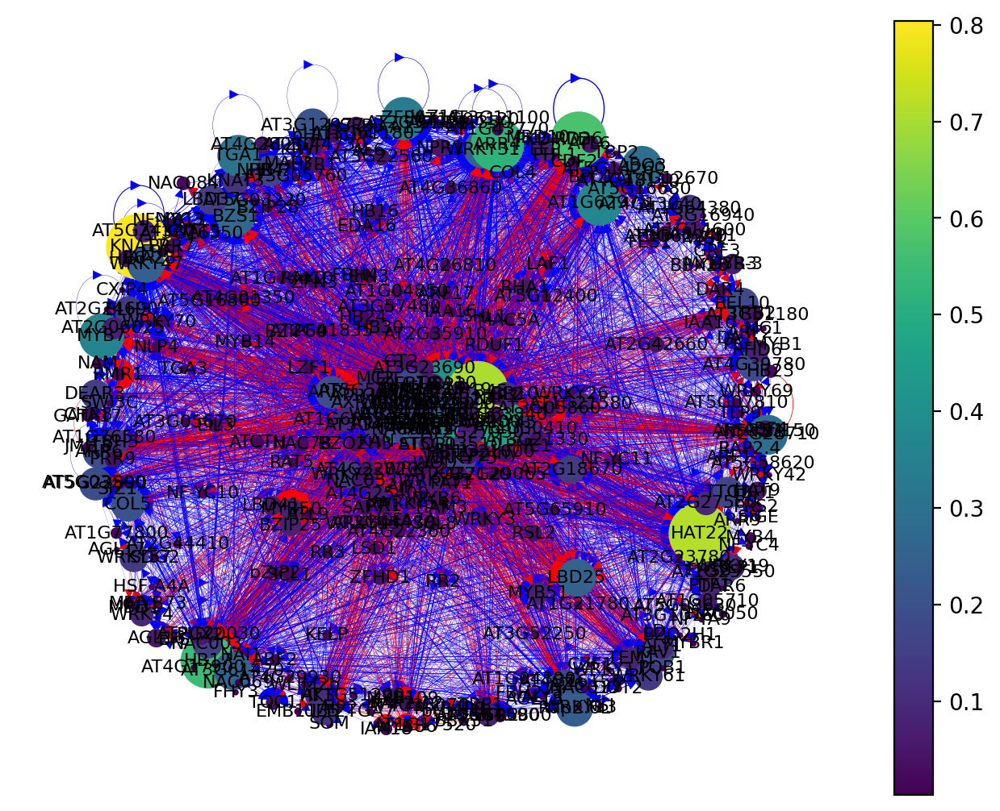

In [19]:
atri = network(0)

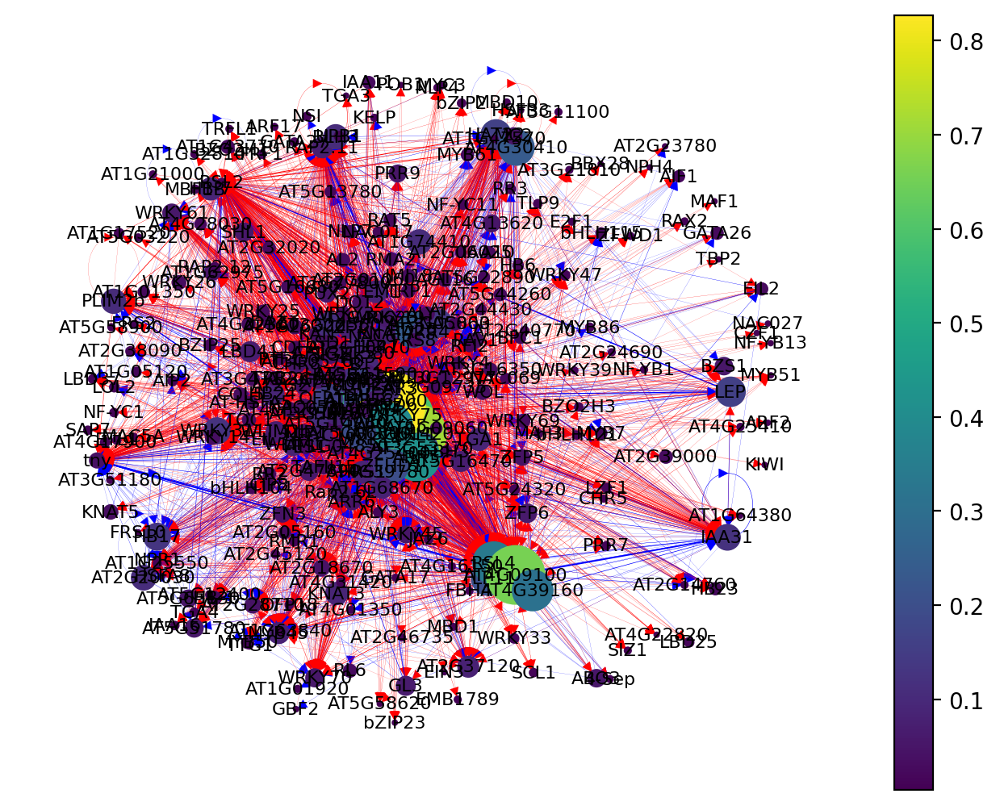

In [20]:
tri = network(1)

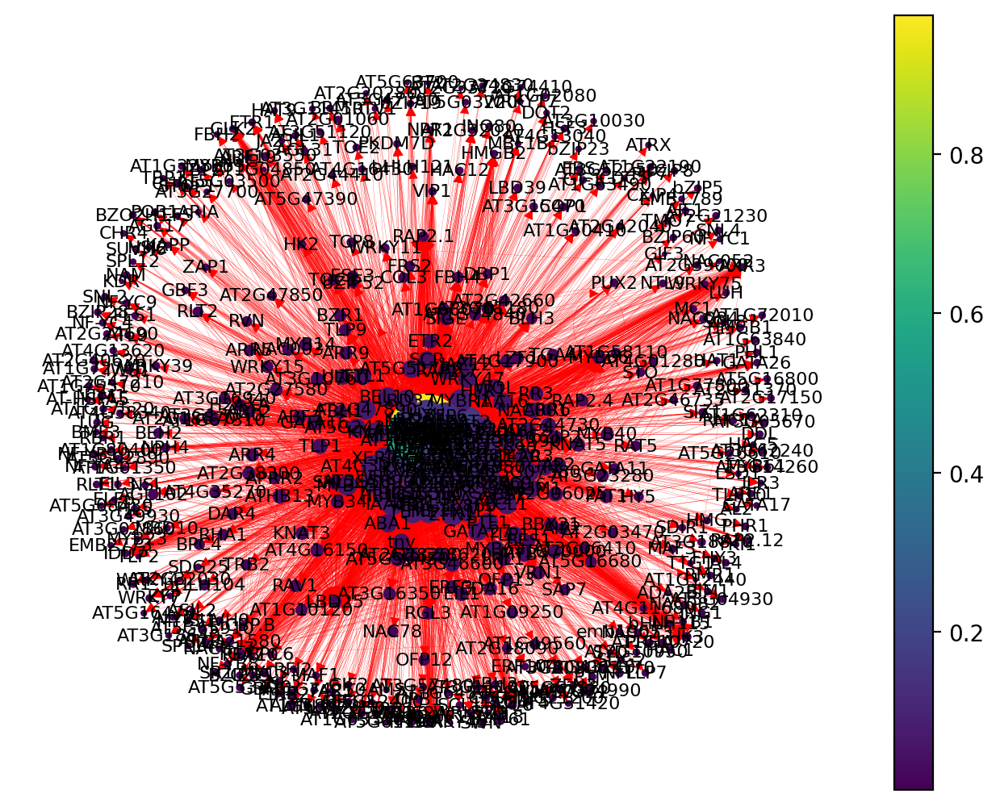

In [21]:
cor = network(2)

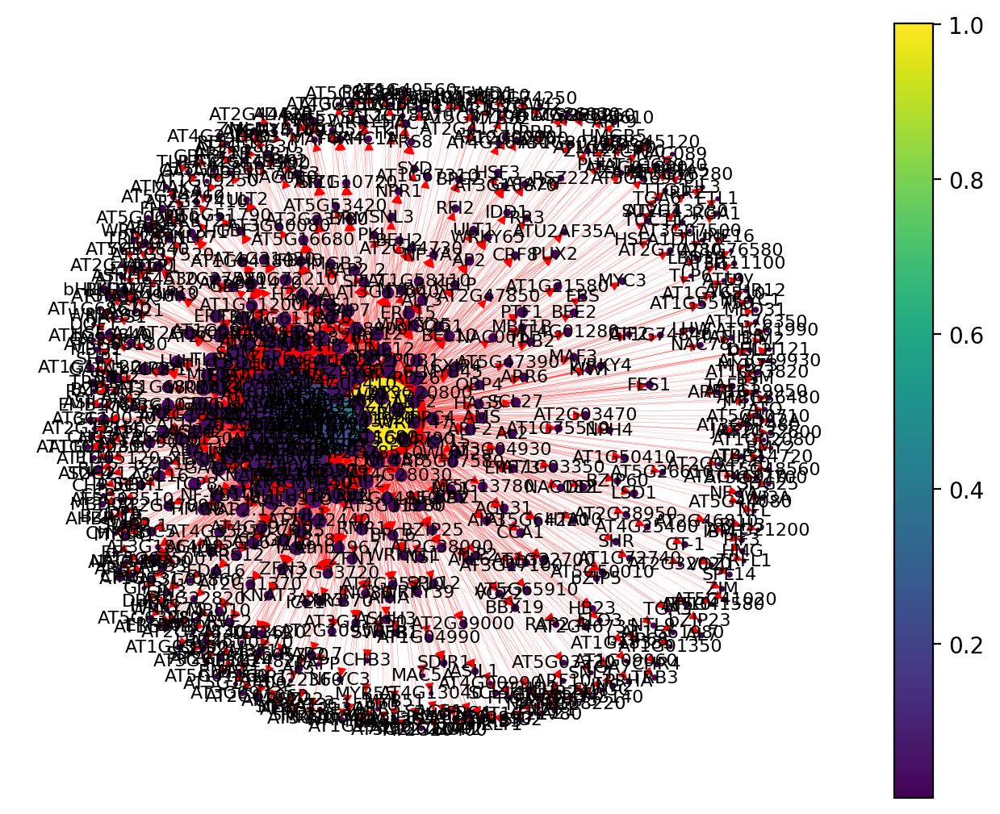

In [22]:
end = network(3)

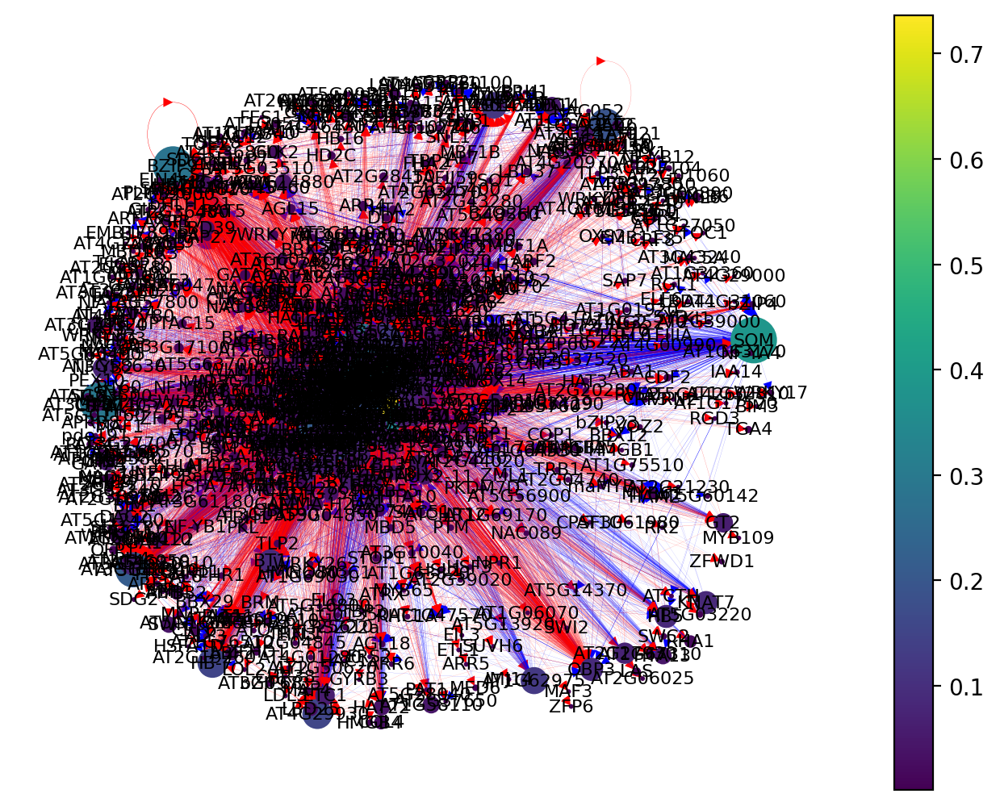

In [23]:
per = network(4)

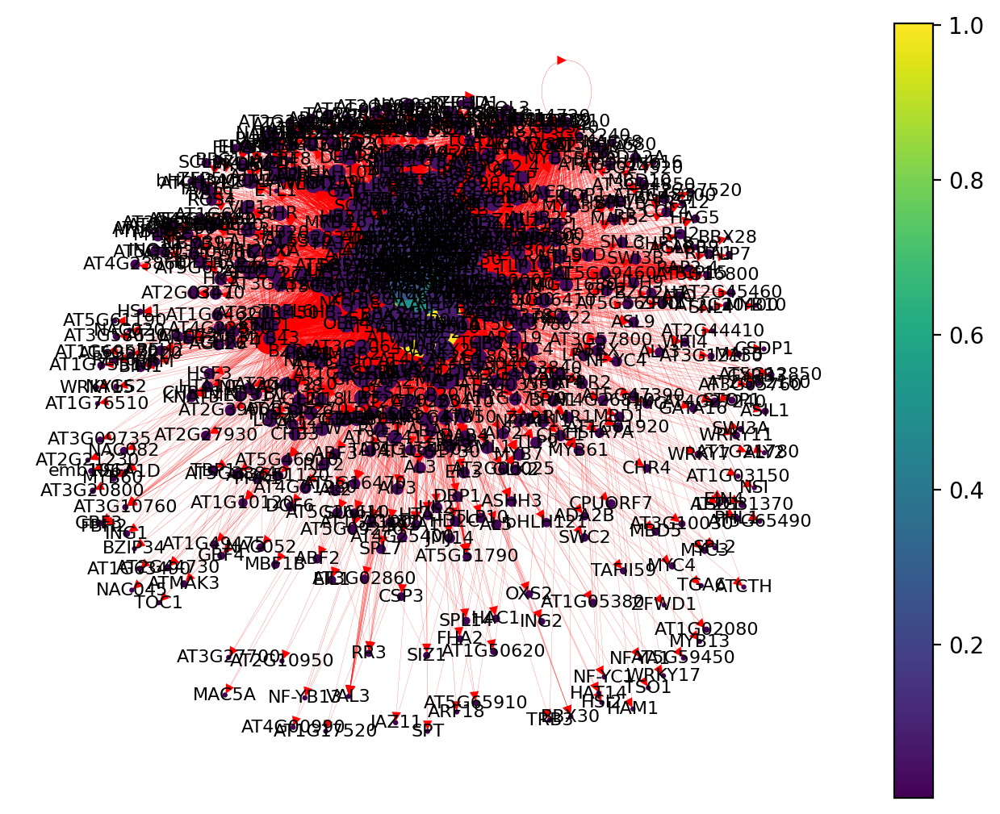

In [24]:
pro = network(5)

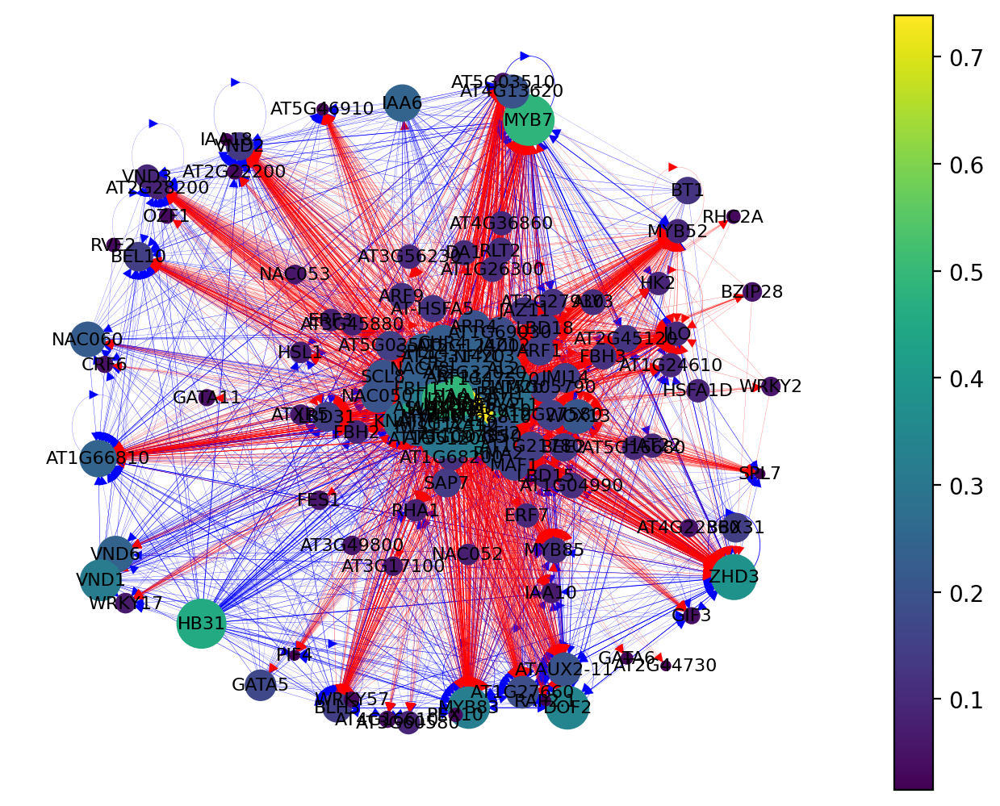

In [25]:
xyl = network(6)

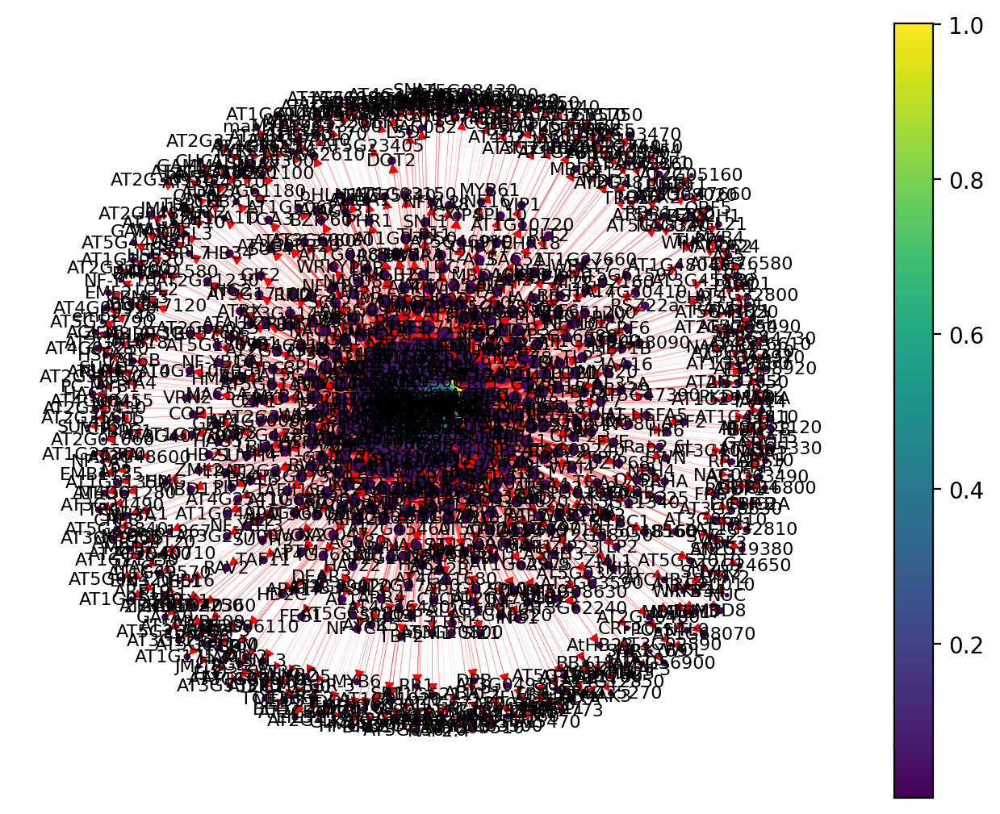

In [26]:
phl = network(7)

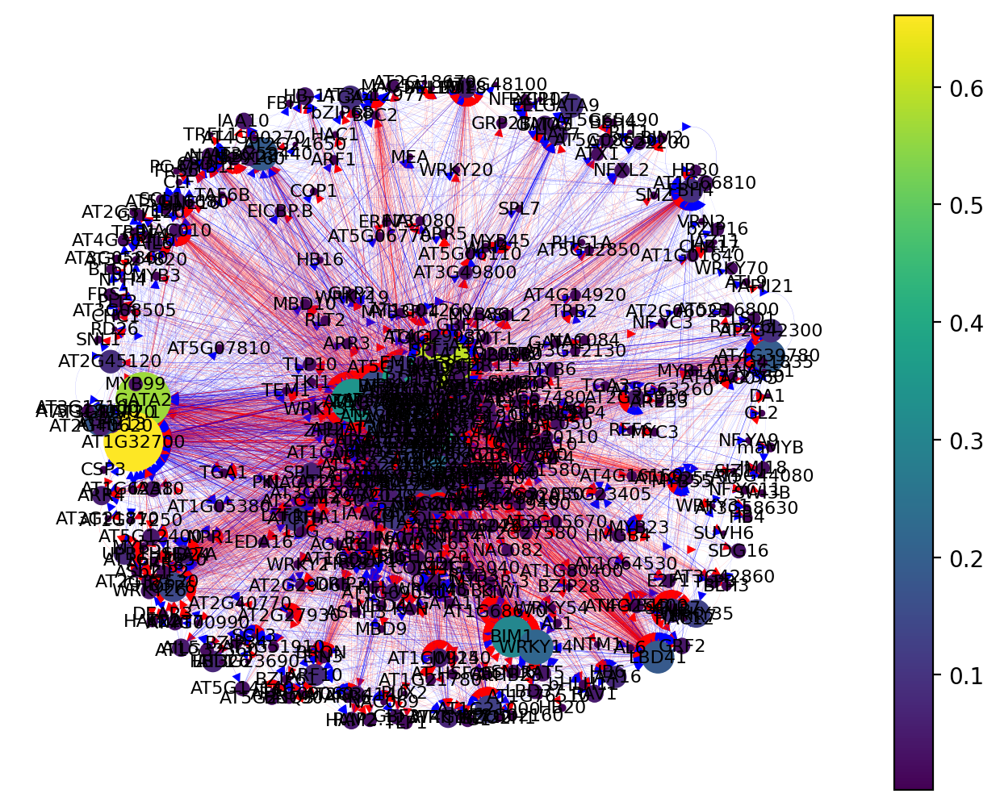

In [27]:
lrc = network(8)

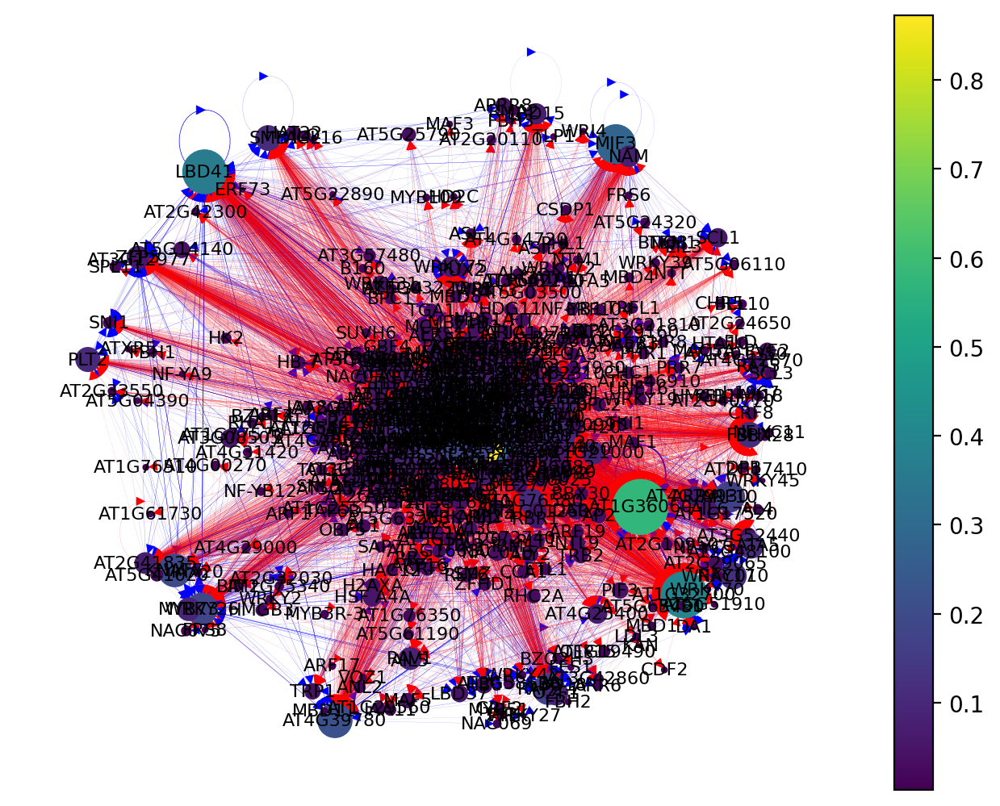

In [28]:
col = network(9)

In [29]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [30]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts(), columns=['tf_occurance'])
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [31]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum
NAC6,0.966043,0.024021,0.211362,0.123919,0.053004,0.013304,0.469741,0.084806,0.042129,9,10.988327
AT2G28710,0.949459,0.003534,0.001715,0.285303,0.042403,0.015521,0.435159,0.102473,0.037694,9,10.873260


In [32]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
LRL3,0.989289,0.959652,0.409222,0.544170,0.221902,0.886926,6,10.011160
HB17,0.952191,0.879896,0.550432,0.130742,0.340058,0.113074,6,8.966394
RHD6,0.758558,0.770456,0.080692,0.826855,0.086455,0.240283,6,8.763299
WRKY31,0.724676,0.868443,0.253602,0.123675,0.253602,0.236749,6,8.460748
WRKY61,0.787360,0.872015,0.138329,0.056537,0.368876,0.222615,6,8.445731
WRKY45,0.960495,0.003534,0.466859,0.049470,0.605187,0.279152,6,8.364697
MYB50,0.961162,0.186026,0.077810,0.024735,0.342939,0.102473,6,7.695146
AT3G05860,0.030576,0.577413,0.040346,0.137809,0.233429,0.014134,6,7.033707
MC2,0.019065,0.196677,0.069164,0.045936,0.092219,0.137809,6,6.560871


In [33]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
NAC003,0.739626,0.152738,0.201729,3,4.094093
TTG2,0.620546,0.167147,0.057637,3,3.845330
AT5G22890,0.262514,0.190202,0.230548,3,3.683264
GL2,0.064125,0.112392,0.106628,3,3.283145
OFP18,0.028652,0.164265,0.144092,3,3.337009


In [34]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
AT3G53370,0.977846,0.190813,0.201413,3,4.370072
AT5G56200,0.974964,0.074205,0.406360,3,4.455530
IAA31,0.955392,0.120141,0.409894,3,4.485427
RAP2.11,0.946846,0.074205,0.487633,3,4.508684
RSL4,0.864810,0.335689,0.515901,3,4.716400
AT4G09100,0.584455,0.657244,0.367491,3,4.609190
AT5G06800,0.575082,0.194346,0.120141,3,3.889570
AT2G37120,0.373543,0.077739,0.098940,3,3.550222
RSL2,0.358031,0.010601,0.812721,3,4.181352
AT2G20030,0.304814,0.109541,0.081272,3,3.495627


In [35]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
CRF3,0.766144,0.177384,0.070953,3,4.014481
OFP6,0.763035,0.148559,0.113082,3,4.024676
ANL2,0.700271,0.082040,0.152993,3,3.935304
AT1G05805,0.555511,0.133038,0.104213,3,3.792762
ATCTH,0.469322,0.104213,0.079823,3,3.653358
IAA1,0.270909,0.166297,0.053215,3,3.490421
ATS,0.267859,0.221729,0.015521,3,3.505110
GATA2,0.248628,0.565410,0.015521,3,3.829559
AT5G64220,0.042385,0.090909,0.024390,3,3.157684
AT2G42300,0.035437,0.090909,0.048780,3,3.175127


In [36]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
AT2G45120,0.171690,0.061571,0.070064,3,3.303325
PLT2,0.161964,0.104034,0.218684,3,3.484682
RAT5,0.066265,0.065817,0.114650,3,3.246732
AT1G76580,0.017301,0.106157,0.416136,3,3.539594
CHR11,0.008438,0.082803,0.165605,3,3.256846
PRR7,0.006369,0.014862,0.178344,3,3.199575
CRF8,0.006365,0.023355,0.152866,3,3.182586
AT5G65910,0.004716,0.125265,0.154989,3,3.284971
AT3G52250,0.004278,0.140127,0.067941,3,3.212346
LUG,0.004233,0.106157,0.133758,3,3.244148


In [37]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
AT1G05710,0.601886,0.023260,0.561866,0.209749,0.983773,0.527326,6,8.907860
MYB74,0.368748,0.059388,0.973631,0.308715,0.010142,0.511078,6,8.231702
MYB68,0.000186,0.008028,0.344828,0.223043,0.002028,0.265879,6,6.843991
MYB122,0.000602,0.014463,0.215010,0.122600,0.154158,0.271787,6,6.778620
JAZ6,0.048319,0.000004,0.152130,0.028065,0.361055,0.005908,6,6.595481
AT4G00940,0.000029,0.014802,0.121704,0.103397,0.012170,0.342688,6,6.594790
AGL102,0.000008,0.023310,0.014199,0.064993,0.010142,0.400295,6,6.512947
AT1G72210,0.015345,0.000002,0.188641,0.020679,0.219067,0.002954,6,6.446689
VIP1,0.000016,0.002919,0.008114,0.085672,0.046653,0.273264,6,6.416639
BLJ,0.000037,0.000031,0.135903,0.165436,0.004057,0.088626,6,6.394089


In [38]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
JKD,0.044072,0.300203,0.115619,3,3.459894
ATL9,0.022791,0.004057,0.030426,3,3.057273
LAF1,0.009400,0.144016,0.829615,3,3.983031
SIGE,0.003884,0.020284,0.052738,3,3.076906
AP2,0.002424,0.030426,0.034483,3,3.067333
AT3G61180,0.001035,0.022312,0.060852,3,3.084199
AT2G46735,0.001022,0.008114,0.024341,3,3.033477
AT2G38300,0.000961,0.024341,0.103448,3,3.128750
AT2G32030,0.000956,0.002028,0.012170,3,3.015155
RLT2,0.000886,0.014199,0.022312,3,3.037398


In [39]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
bZIP58,0.047224,0.119645,0.534712,3,3.701581
chr31,0.029040,0.215657,0.127031,3,3.371728
NGA3,0.005548,0.005908,0.005908,3,3.017365
AT4G38340,0.002552,0.042836,0.280650,3,3.326038
HSF3,0.001938,0.007386,0.002954,3,3.012278
ING1,0.001414,0.045790,0.104874,3,3.152078
AT3G16280,0.000623,0.002954,0.001477,3,3.005054
AT1G74840,0.000601,0.004431,0.001477,3,3.006509
ULT1,0.000527,0.007386,0.001477,3,3.009389
ASIL1,0.000500,0.005908,0.002954,3,3.009363


In [40]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
IAA11,0.00125,0.000003,0.000673,0.000042,0.0075,0.110927,0.291045,0.110218,0.15,0.021523,0.731343,0.10333,12,13.527854


In [41]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT2G14880,0.578174,0.04125,0.02875,3,3.648174
ETC1,0.448353,0.06000,0.03750,3,3.545853
NF-YB2,0.331115,0.07500,0.12000,3,3.526115
HTA13,0.177725,0.04625,0.01875,3,3.242725
AT2G20100,0.154229,0.22875,0.03000,3,3.412979
GAMMA-H2AX,0.109718,0.02375,0.02625,3,3.159718
IDD11,0.107380,0.25500,0.03000,3,3.392380
GATA20,0.074492,0.07125,0.09000,3,3.235742
LBD39,0.070462,0.03125,0.04125,3,3.142962
BHLH32,0.065144,0.23250,0.04125,3,3.338894


In [42]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
AT3G03590,0.123640,0.024834,0.006623,3,3.155096
PHB,0.004313,0.066225,0.364238,3,3.434777
RGA1,0.003654,0.011589,0.021523,3,3.036767
AT3G60080,0.000931,0.048013,0.023179,3,3.072123
HUA1,0.000857,0.034768,0.023179,3,3.058804
AT5G12850,0.000763,0.004967,0.006623,3,3.012353
ASHH1,0.000728,0.039735,0.023179,3,3.063642
VAL3,0.000599,0.001656,0.021523,3,3.023777
AIP3,0.000500,0.018212,0.006623,3,3.025334
ARF19,0.000472,0.033113,0.023179,3,3.056764


In [43]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
AT1G66810,0.554371,0.246269,0.738806,3,4.539446
ZHD3,0.516665,0.380597,0.850746,3,4.748008
LBD31,0.508417,0.149254,0.701493,3,4.359163
MYB85,0.503928,0.111940,0.559701,3,4.175570
MYB83,0.495848,0.320896,0.813433,3,4.630176
MYB52,0.483952,0.097015,0.753731,3,4.334699
VND2,0.466446,0.134328,0.753731,3,4.354506
NAC050,0.219616,0.201493,0.425373,3,3.846482
MYB46,0.201493,0.514925,0.902985,3,4.619403
IAA6,0.198406,0.246269,0.007463,3,3.452138


In [44]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G06220,0.028443,0.008037,0.022962,3,3.059442
TGA3,0.012955,0.008037,0.016073,3,3.037065
CRF1,0.003381,0.053961,0.030999,3,3.088341
NAC045,0.002858,0.032147,0.020666,3,3.055671
AT5G63700,0.001495,0.143513,0.167623,3,3.312632
...,...,...,...,...,...
VRN2,0.000001,0.008037,0.005741,3,3.013779
MBD13,0.000001,0.008037,0.009185,3,3.017223
PEX10,0.000001,0.012629,0.013777,3,3.026408
TCP8,0.000001,0.010333,0.012629,3,3.022963


## Search for individual genes

In [45]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality,per_degree_centrality,per_out_centrality,per_in_centrality,per_betweenness_centrality,per_closeness_centrality,per_eigenvector_centrality,pro_degree_centrality,pro_out_centrality,pro_in_centrality,pro_betweenness_centrality,pro_closeness_centrality,pro_eigenvector_centrality
SHR,2.0,0.007386,0.005908,0.001477,0.000229,0.007293,0.055,0.0475,0.0075,0.000205,0.000429,0.022521,0.054636,0.033113,0.021523,0.000003,0.000192,0.029372


In [46]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,2.0,0.139959,0.135903,0.004057,0.000037,0.000284,0.065661,0.254062,0.165436,0.088626,0.000031,0.000329,0.114923


In [47]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_betweenness_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_closeness_centrality,end_eigenvector_centrality
JKD,1.0,0.415822,0.300203,0.115619,0.044072,0.000351,0.116992,0.153619,0.076809,0.076809,0.000282,0.083118


In [48]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
RVN,1.0,0.026369,0.014199,0.01217,0.000222,0.01834,0.132939,0.033973,0.098966,0.000026,0.000268,0.073572


In [49]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,1.0,0.069424,0.035451,0.033973,0.000004,0.000259,0.050834


In [50]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [51]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [52]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,lrc_degree_centrality,lrc_out_centrality,lrc_in_centrality,lrc_closeness_centrality,lrc_eigenvector_centrality
GL2,1.0,0.21902,0.112392,0.106628,0.064125,0.00072,0.069171,0.017738,0.004435,0.013304,0.000546,0.011854


In [53]:
tf_spec.to_csv('TF_GRN_centrality_t7-t9_zscore3.csv', index=True)